<a href="https://colab.research.google.com/github/wenchun0731/city-hunter/blob/main/crosswalk.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


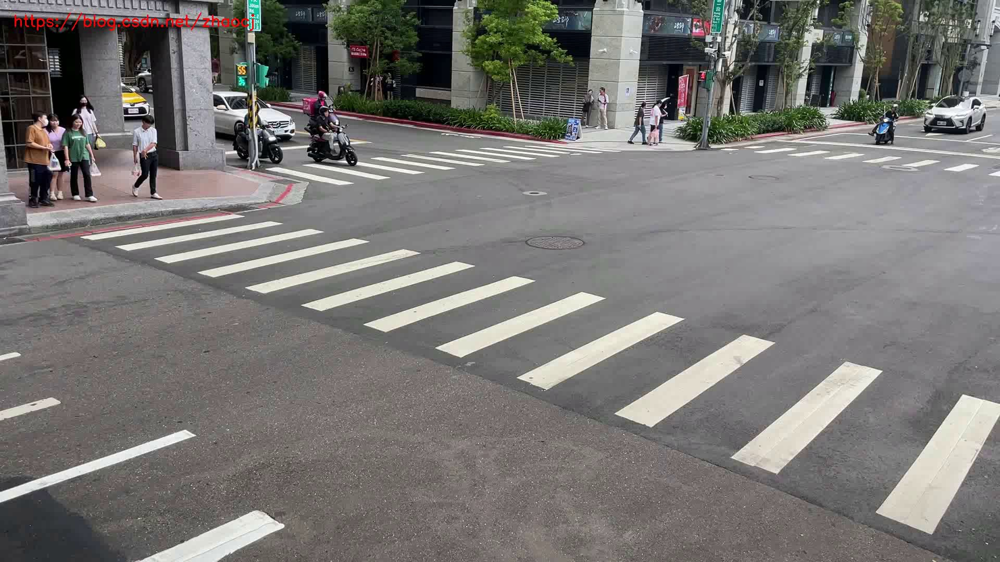

In [ ]:
import cv2
from google.colab.patches import cv2_imshow
image=cv2.imread('/content/drive/MyDrive/Finetune/Licence_Finetune/FrameOutput/frame_0000.jpg')
image2=image.copy()
cv2_imshow(image2)

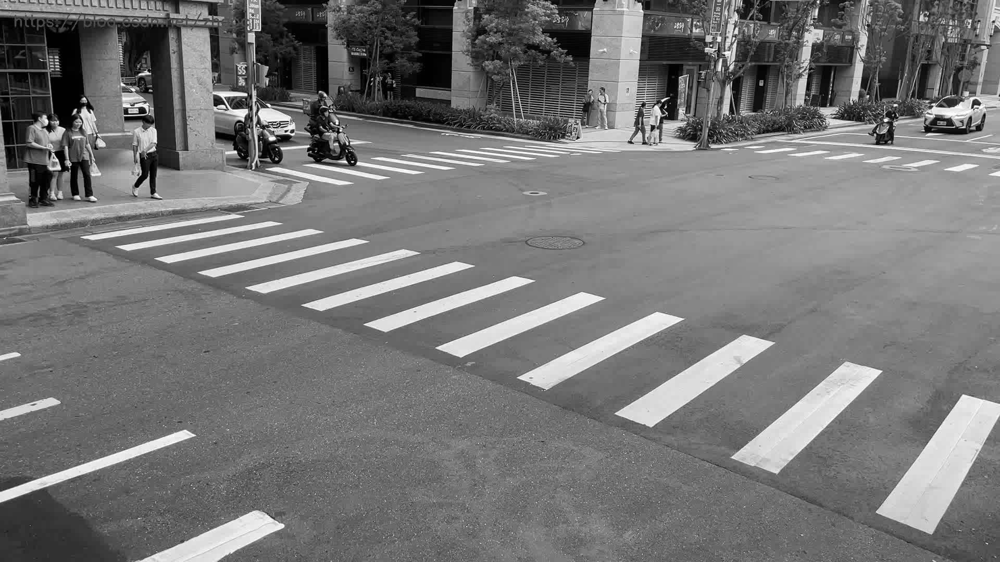

In [ ]:
gray_img = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)
from google.colab.patches import cv2_imshow
cv2_imshow(gray_img)


In [ ]:
# import numpy as np

# mask=np.ones_like(gray_img)*0
# h,w=mask.shape[0:]
# # print(h,w)
# mask[400:h,200:w]=255
# # mask[0:h,0:w]=255
# mask_edges=cv2.bitwise_and(gray_img,mask)
# cv2_imshow(mask_edges)


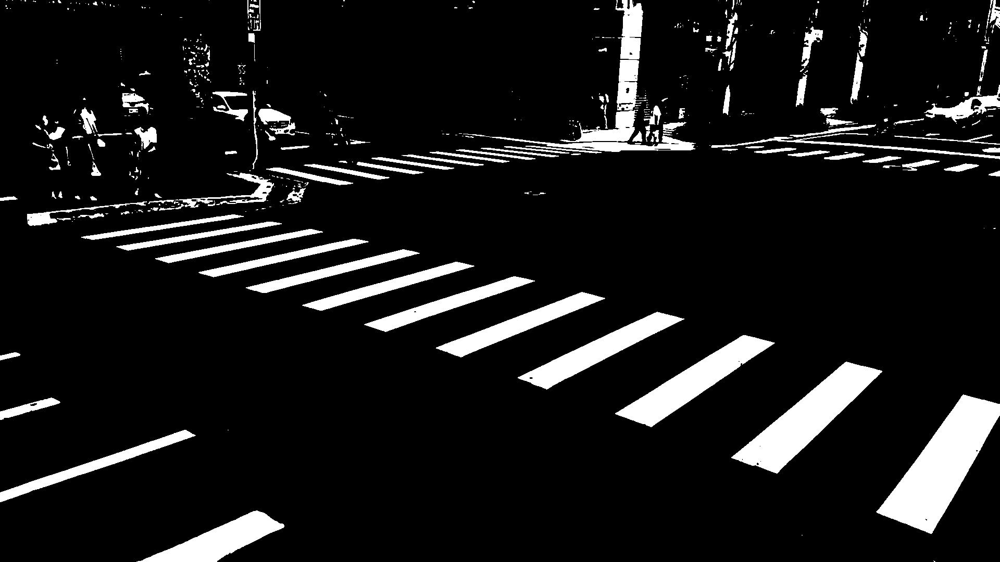

In [ ]:
threshold_value = 180  # 可以根據需要調整
max_value = 255
_, binary_image = cv2.threshold(img_blur, threshold_value, max_value, cv2.THRESH_BINARY)
cv2_imshow(binary_image)


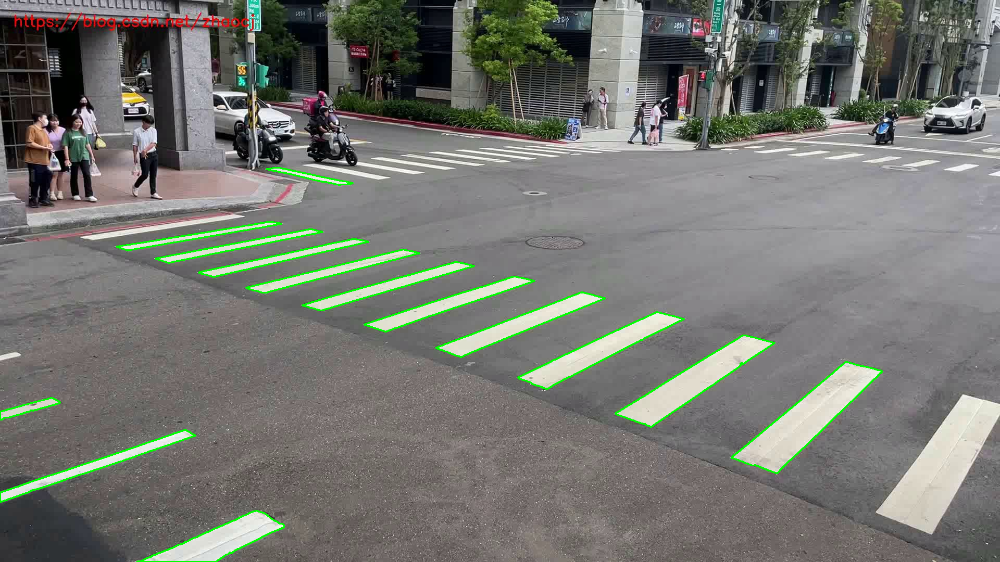

In [ ]:
contours, hierarchy = cv2.findContours(binary_image, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
contour_all=[]
h,w=binary_image.shape[0:]

for contour in contours:
    #計算面積，看面積有沒有大於1000
    area=cv2.contourArea(contour)
    if area>1000:

      # 使用多邊形逼近法來取得簡化的頂點
      epsilon = 0.01 * cv2.arcLength(contour, True)
      approx = cv2.approxPolyDP(contour, epsilon, True)

      # 檢查是否為四邊形
      if len(approx) == 4:
          # 計算邊的長度比和角度，確認是否為平行四邊形
          # 這裡可以加入計算平行邊的判斷邏輯

          contour_all.append(contour)


cv2.drawContours(image, contour_all, -1, (0, 255, 0), 2)

cv2_imshow(image)
image=image2.copy()


moments圖像矩:計算圖像的特徵量

M[m00]面積

M[m01]一階矩

423 1037
182 893
53 783
1548 803
1330 732
1148 673
994 623
857 584
740 550
633 521
538 495
452 472
375 453
595 338


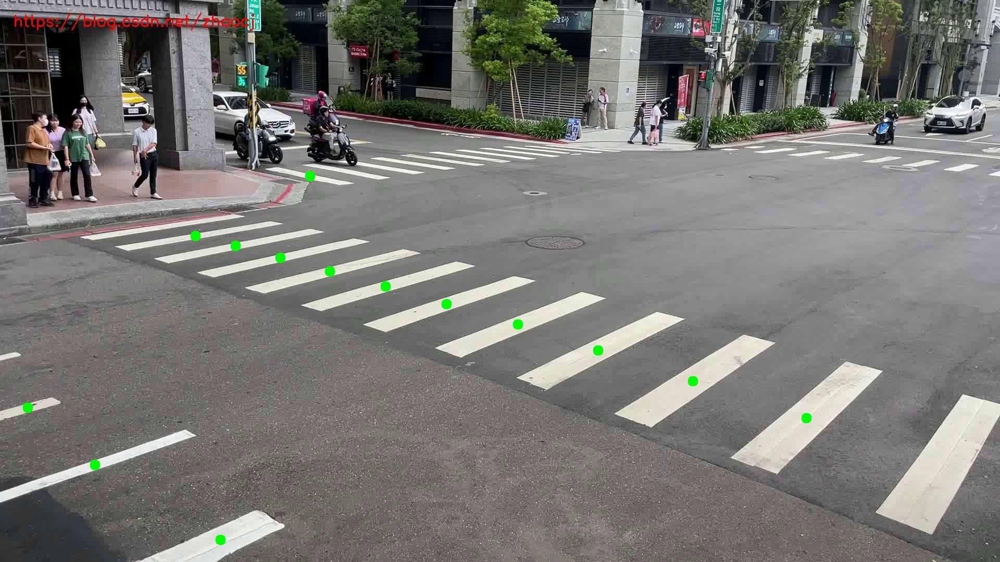

In [ ]:
ox,oy=w,h
pointx=[]
pointy=[]
for contour in contour_all:
    M = cv2.moments(contour)
    if M['m00'] != 0:
        cx = int(M['m10'] / M['m00'])
        cy = int(M['m01'] / M['m00'])
        print(cx,cy)

        slope=(cy-oy)/(cx-ox)

        # 斜率大於-0.20的不要
        if slope>0:
          pointx.append(cx)
          pointy.append(cy)
    else:
        cx, cy = 0, 0

    # 在圖像上標記中心點
    cv2.circle(image, (cx, cy), 10, (0, 255, 0), -1)
cv2_imshow(image)

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

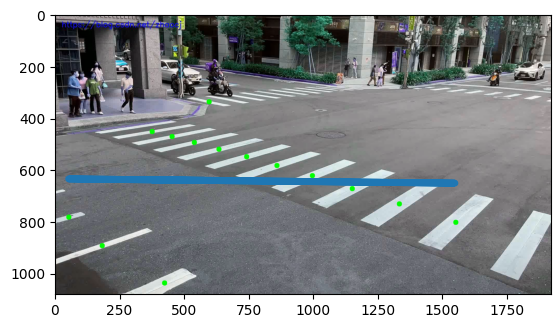

In [ ]:
# 擬合直線
#用來計算多項式的最佳擬合係數
coefficients = np.polyfit(pointx, pointy, 1)
# 提取斜率和截距
linear_fit = np.poly1d(coefficients)
slope=round(coefficients[0],3)
intercept=round(coefficients[1],3)

coefficients_o=[slope,intercept]
#當x等於多少的時候y等於多少

linear_fit_o = np.poly1d(coefficients_o)

# coefficients_one=[slope+0.04,intercept+70]
# #當x等於多少的時候y等於多少

# linear_fit_one = np.poly1d(coefficients_one)

# coefficients_two=[slope-0.075,intercept-25]
# linear_fit_two = np.poly1d(coefficients_two)
# 繪製原始點和擬合的直線
plt.imshow(image)
# plt.plot(pointx, linear_fit_two(pointx), linewidth=5)  # 擬合直線
plt.plot(pointx, linear_fit_o(pointx), linewidth=5)  # 擬合直線
# plt.plot(pointx, linear_fit_two(pointx), linewidth=3)  # 擬合直線

# 顯示圖形
plt.show()

截距大概各25

In [ ]:
print(slope)

# 三個參數(斜率,截距,行人座標)
輸入是車子座標與行人座標

low_y=-x*slope+(intercept+25)

up_y=-x*slope+(intercept-25)

In [ ]:
from google.colab import drive
from google.colab.patches import cv2_imshow
import numpy as np
import cv2
import matplotlib.pyplot as plt
drive.mount('/content/drive')
image=cv2.imread('/content/drive/MyDrive/Finetune/Licence_Finetune/FrameOutput/frame_0000.jpg')


class identify_crosswalk:
  def __init__(self,image):
    self.image=image
    self.h=self.image.shape[0]
    self.w=self.image.shape[1]

  def main_crosswalk(self):
    gray_img=self.opencv_gray()
    mask_edges=self.opencv_mask(gray_img)
    binary_image=self.opencv_thres(mask_edges)
    contour_all=self.opencv_contours(binary_image)
    pointx,pointy=self.opencv_moments(contour_all)
    return self.opencv_polyfit(pointx,pointy)

  def opencv_gray(self):
    gray_img = cv2.cvtColor(self.image,cv2.COLOR_BGR2GRAY)
    return gray_img

  def opencv_mask(self,image):
    mask=np.ones_like(image)*0

    mask[400:self.h,200:self.w]=255
    mask_edges=cv2.bitwise_and(image,mask)
    return mask_edges


  def opencv_thres(self,image):
    threshold_value = 180  # 可以根據需要調整
    max_value = 255
    _, binary_image = cv2.threshold(image, threshold_value, max_value, cv2.THRESH_BINARY)
    return binary_image

  def opencv_contours(self,image):
    contours, hierarchy = cv2.findContours(image, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    contour_all=[]
    for contour in contours:
      area=cv2.contourArea(contour)
      if area>900:
        contour_all.append(contour)
    return contour_all

  def opencv_moments(self,contour_all):
    ox,oy=self.w,self.h
    pointx=[]
    pointy=[]
    for contour in contour_all:
        M = cv2.moments(contour)
        if M['m00'] != 0:
            cx = int(M['m10'] / M['m00'])
            cy = int(M['m01'] / M['m00'])


            slope=(cy-oy)/(cx-ox)

            # 斜率大於-0.20的不要
            if slope>0.30:
              pointx.append(cx)
              pointy.append(cy)
        else:
            cx, cy = 0, 0

    return pointx,pointy

  def opencv_polyfit(self,pointx,pointy):
    # 擬合直線
    #用來計算多項式的最佳擬合係數
    coefficients = np.polyfit(pointx, pointy, 1)
    # 提取斜率和截距
    linear_fit = np.poly1d(coefficients)
    slope=round(coefficients[0],3)
    intercept=round(coefficients[1],3)
    return slope,intercept

identyfyCrosswalk=identify_crosswalk(image)
slope,intercept=identyfyCrosswalk.main_crosswalk()


In [ ]:
print(slope,intercept)

In [ ]:
import math

rule_id = []

class TrafficViolationDetector:
    def __init__(self, image_data, slope, intercept):
        self.image_data = image_data
        self.slope = slope
        self.intercept = intercept

    def detect_violations(self):
        self.data_sort()
        self.rule_judge()

    def data_sort(self):
        # 這裡假設你只需要處理單一幀的數據
        for tag, data in self.image_data.items():
            for data_k, data_v in data.items():
                for id, coordinate in enumerate(data_v):
                    if self.on_crosswalk(coordinate[0], coordinate[1]):
                        data_v[id] = coordinate
                    else:
                        data_v[id] = []

                # 過濾空陣列
                self.image_data[tag][data_k] = [item for item in data_v if item]

    def on_crosswalk(self, x, y):
        low_y = (self.slope - 0.06) * x + (self.intercept - 60)
        up_y = (self.slope + 0.04) * x + (self.intercept + 80)
        return up_y > y > low_y

    def rule_judge(self):
        people_data = self.image_data['person']
        car_data = self.image_data['car']

        for c_k, c_v in car_data.items():
            is_violation = False
            for p_v in people_data.values():
                if is_violation:
                    break
                for c_data, p_data in [[c, p] for c in c_v for p in p_v]:
                    if self.distance_cal(c_data, p_data):
                        is_violation = True
                        self.you_violation(c_k)
                        break

    def distance_cal(self, car, person):
        x_minus = abs(car[0] - person[0])
        y_minus = abs(car[1] - person[1])
        if y_minus == 0:
            distance = x_minus
        elif x_minus == 0:
            distance = y_minus
        else:
            distance = math.hypot(x_minus, y_minus)
        return distance >= 250

    def you_violation(self, id):
        if id not in rule_id:
            rule_id.append(id)
            print(f'車輛{id}違規')
            self.clear_list(self.image_data)

    # 定義清空列表的函式
    def clear_list(self,lst):
        lst.clear()  # 使用 clear() 方法清空列表

# 更新 image_data 為新的結構
image_data = {
    'person': {
        '01': [[750, 600], [20, 30], [40, 50], [60, 70]],
        '02': [[10, 20], [20, 30], [40, 50], [60, 70]]
    },
    'car': {
        '01': [[1000, 600], [20, 30], [40, 50], [60, 70]],
        '02': [[1000, 600], [20, 30], [40, 50], [60, 70]]
    }
}

# 需要定義 slope 和 intercept 的值


detector = TrafficViolationDetector(image_data, slope, intercept)
detector.detect_violations()